# Wstęp

Zadanie nr 13 wprowadza zagadnienie głębokich modeli uczenia ze wzmocnieniem (*Deep Reinforcement Learning*, **DRL**) - modeli, które uczone są przez interakcję z otoczeniem, obserwując konsekwencję działań oraz przyznawaną wartość nagrody.

## Cel ćwiczenia

Celem ćwiczenia jest zapoznanie z:
* koncepcją głębokiego uczenia ze wzmocnieniem,
* podstawowymi podejściami w głębokim uczeniu ze wzmocnieniem,
* przykładowymi środowiskami, wykorzystywanym w DRL,
* jedną z podstawowych metod DRL opartą na funkcji wartości.


# Głębokie uczenie ze wzmocnieniem

Podstawa reinforcement learning jest uczenie przez interakcje ̨: agent oddziałuje z otoczeniem i, obserwując konsekwencje jego działań, może uczyć się jak zmienić swoje zachowanie by zmaksymalizować wartość otrzymanej nagrody.

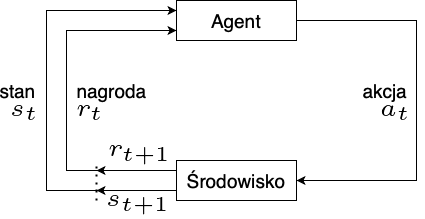

Zasada działania modelu uczenia ze wzmocnieniem jest następująca: autonomiczny agent, sterowany przez model, obserwuje **stan $s_t$ środowiska** w kroku czasowym $t$. Agent oddziałuje z otoczeniem podejmując **akcję $a_t$**, co powoduje przejście otoczenia i agenta do nowego stanu $s_{t+1}$. Przejście to odbywa się na podstawie **funkcji przejścia stanów $T(s_{t+1} | s_t, a_t)$** (równoważnej środowisku) - na podstawie aktualnego stanu i podjętej akcji. Zakładamy, że informacja o stanie jest wystarczająca dla agenta do podjęcia optymalnej akcji.

Sekwencja akcji wybierana jest na podstawie nagrody, przyznawanej przez otoczenie agentowi. Każde przejście środowiska do nowego stanu powoduje nagrodzenie agenta **nagrodą $r_t$**, tj. wartością skalarną, określającą "poprawność" podjętej decyzji. Celem uczenia modelu DRL jest wyuczenie **strategii**, maksymalizującej łączną uzyskiwaną wartość nagrody (*zwrot*).

Agent uczenia ze wzmocnieniem może składać się z następujących elementów (w zależności od stosowanego podejścia zawiera jeden lub więcej z nich):
* **strategia** (ang. *policy*), tj. funkcja zachowywania się agenta; może być deterministyczna $a = \pi(s)$ lub stochastyczna $\pi(a|s)=p(a_t=a | s_t=s)$;
* **funkcja wartości** (ang. *value function*), tj. funkcja służąca do predykcji przyszłej nagrody, używana do oceny stanów przy podejmowaniu akcji:
$$V_{\pi}(s)=\mathbb{E}\left[r_{t+1}+\gamma r_{t+2}+\gamma^2 r_{t+3}+\dots | s_t=s\right],$$
gdzie $\gamma\in[0, 1]$ to współczynnik dyskontowania, określający, w jakim stopniu faworyzowane są nagrody natychmiastowe;
* **model**, służący do predykcji zmian w środowisku:
$$\mathcal{P}_{ss'}^a = p(s_{t+1}=s | s_t=s, a_t=a),$$
$$\mathcal{R}_s^a = \mathbb{E}[r_{t+1} | s_t=s, a_t=a],$$
gdzie $\mathcal{P}$ przewiduje kolejny krok, a $\mathcal{R}$ wskazuje następną wartość nagrody.

W zależności od elementów metody uczenia ze wzmocnieniem dzielimy na:
* oparte na funkcji wartości (bez strategii) - trenujemy model aby poprawnie oceniał wartość nagrody za każdą z możliwych podejmowanych akcji,
* oparte na strategii (bez funkcji wartości) - *policy gradient* - trenujemy model strategii, która bezpośrednio zwraca akcje, maksymalizujące wartość nagrody,
* aktor-krytyk (wykorzystujące strategię oraz funkcję wartości) - połączenie powyższych (aktor to model strategii, kontrolujący zachowanie agenta, a krytyk to model funkcji wartości, oceniająca akcje podejmowane przez krytyka).

Każda z tych metod może być też *model-free* (bez wykorzystania modelu środowiska) lub *model-based* (modelująca środowisko).

W tym zadaniu skupimy się na **podejściu *model-free* opartym na funkcji wartości**.


## Funkcje wartości

Podejścia wykorzystujące funkcje wartości to metody oparte na estymowaniu wartości zwrotu (całkowitej nagrody). Wartość ta może być estymowana wyłącznie na podstawie aktualnego stanu - wówczas mówimy o **funkcji stan-wartość** $V^\pi(s) = \mathbb{E}[R | s, \pi]$, która ocenia wartość nagrody przy założeniu postępowania od danego stanu zgodnie ze strategią $\pi$. W idealnej sytuacji, optymalna strategia mogłaby być wybierana na podstawie akcji maksymalizujących oczekiwaną wartość nagrody; niestety jednak funkcja przejścia stanów $T(s_{t+1} | s_t, a_t)$ nie jest znana agentowi.

Rozwiązaniem jest konstrukcja funkcji, która będzie estymowała wartość zwrot na podstawie stanu oraz podejmowanej akcji - **funkcja jakości** $Q^\pi(s, a) = \mathbb{E}[R | s, a, \pi]$ - tu oceniana jest wartość zwrotu po podjęciu danej akcji w danym stanie, przy postępowaniu dalej zgodnie ze strategią $\pi$. Wówczas, najlepsza strategia może być znaleziona przez zachłanny wybór akcji maksymalizującej wartość funkcji $Q$: $\arg\max_a Q^\pi(s, a)$, w ten sposób definiując aproksymację poszukiwanej funkcji wartości na podstawie maksymalizowania funkcji jakości:

$$V^\pi(s) \approx \max_a Q^\pi(s, a).$$

W takim podejściu skupiamy się na eksploatacji aktualnie wykrytego maksimum; często jednak chcielibyśmy również eksplorować rozwiązania alternatywne, na co pozwala strategia $\epsilon$-zachłanna (z prawdopodobieństwem $1-\epsilon$ wybieramy maksymalizującą akcję, a z prawdopodobieństwem $\epsilon$ - losową).

Wartość funkcji jakości może być obliczona ze wzoru rekurencyjnego:

$$Q^\pi(s_t, a_t) = \mathbb{E}_{s_{t+1}}\left[r_t + \gamma Q^\pi\left(s_{t+1}, \pi(s_{t+1})\right)\right],$$

mówimy wówczas o podejściu *on-policy* - do estymacji całkowitej wartości zwrotu i wyboru akcji wykorzystuje się aktualną postać strategii (np. algorytm [SARSA](https://en.wikipedia.org/wiki/State–action–reward–state–action)). Alternatywnie, wybór akcji i estymacja wartości zwrotu może odbywać się poprzez zachłanny wybór akcji maksymalizującej wartość nagrody - mówimy wtedy o algorytmach *off-policy*:

$$Q^\pi(s_t, a_t) = \mathbb{E}_{s_{t+1}}\left[r_t + \gamma \max_a Q^\pi\left(s_{t+1}, a_{t+1}\right)\right].$$

Przykładem drugiej z grup metod jest [Q-learning](https://en.wikipedia.org/wiki/Q-learning). Polega on na budowaniu tabeli pamięci $Q[s, a]$, mającej przechowywać wartości funkcji jakości dla wszystkich możliwych kombinacji stanów $s$ i akcji $a$. Powstaje ona na skutek iteracyjnego próbkowania akcji z bieżącego stanu i zapisywania wartości zwrotu ($Y$), przy dalszym podejmowaniu akcji maksymalizujących wartość uzyskiwanej nagrody. Algorytm powtarzany jest iteracyjnie dla wszystkich możliwych akcji w danym stanie, po czym następuje przejście do kolejnego, niezbadanego stanu. W wytrenowanym modelu tabela ta wykorzystywana jest do wyboru akcji, maksymalizując wartość uzyskiwanej funkcji nagrody.


## Deep Q-Learning (DQL)

Algorytm Q-learning jest słabo skalowalny — w szczególności pod względem wymagań pamięciowych oraz złożoności obliczeniowej dla dużych przestrzeni stanów i akcji, dlatego też w DQN tabela pamięci została zastąpiona przez sieć głęboką (ang. *Deep Q-Network*), której zadaniem jest aproksymacja funkcji jakości $Q(s, a)$.

Uczenie tej sieci odbywa się np. z użyciem funkcji celu - błędu średniokwadratowego między predykcją sieci a końcowymi wartościami zwrotu

$$\mathcal{L} = \mathbb{E}\left[\left(r_t + \gamma \max_a Q^\pi\left(s_{t+1}, a_{t+1}\right) - Q^\pi\left(s_t, a_t\right)\right)^2\right].$$

Można także użyć [Huber loss](https://en.wikipedia.org/wiki/Huber_loss).

Algorytm uczenia tej sieci przedstawiony został poniżej:

```{tidy=FALSE, eval=FALSE}
Get(s);                                         // pobierz stan początkowy
for step <- 1, 2, ... till convergence do       // dla kolejnych kroków
    Sample(a);                                  // wybierz akcję (epsilon-zachłannie)
    Get(s');                                    // ustal nowy stan
    if s' is terminal then                      // jeżeli nowy stan jest stanem końcowym
        Y <- sum(r);                            // ustal wartość zwrotu
        Sample(new s');                         // pobierz nowy stan początkowy
    else:
        Y <- r + gamma * Q_step(s', a')'        // aktualizuj estymację zwrotu
    theta_k+1 <- theta - alpha * grad L(theta); // aktualizuj wagi zgodnie z funkcją celu
    s <- s';                                    // weź nowy stan jako aktualny
```

Wybrane ulepszenia:

- **Zmienna wartość $\epsilon$**.
    Zastosowanie stałej wartości $\epsilon$ w strategii $\epsilon$-zachłannej nie jest najlepszym rozwiązaniem. Zwykle wolelibyśmy, żeby w początkowym etapie model bardziej eksplorował przestrzeń (wyższy $\epsilon$), a w późniejszym etapie by eksploatował znalezione optimum (niższy $\epsilon$). Często stosuje się w tym celu funkcję wykładniczą.

- ***Target network***.
    Stosowane w celu poprawy stabilności trenowania. Polega ono na wykorzystaniu odrębnych instancji do działania w środowisku (*target network*) i odrębnej do trenowania w każdej iteracji (*policy network*). Początkowo, obie sieci są swoimi kopiami, a ich wagi są synchronizowane w trakcie trenowania w określonych interwałach. Algorytm trenowania modelu z *target network* prezentuje się następująco:

    1. Wykonaj kopię modelu (*target network*)
    1. Dla każdego kroku:
        - wykonuj akcję w środowisku z użyciem *policy network* i zapisz czwórkę [stan, akcja, następny stan, nagroda] do utworzenia mini-batcha
        - oblicz oczekiwane wartości funkcji Q używając *target network*
        - oblicz loss i wykonaj propagację wsteczną w *policy network*
    1. Cyklicznie synchronizuj wytrenowane wagi w *policy network* -> *target network*

- ***Experience replay***.
    Podobnie jak *target network* stosowane w celu poprawy stabilności trenowania. Polega ono na zapisywaniu czwórek: stan, akcja, kolejny stan i nagroda $(s_t, a_t, s_{t+1}, r_t)$ w pamięci o ograniczonej wielkości (*experience*). W celu uczenia modelu próbkujemy losowo mini-batch z *experience* i wykorzystujemy do trenowania. W ten sposób model uczony jest na danych niezależnych od siebie, poprawiając stabilność trenowania.

    Wykorzystując *experience replay* algorytm trenowania będzie wyglądał następująco:

    1. Zbuduj pamięć *experience* wykonując akcje niewytrenowanym modelem w środowisku i zapisując czwórki.
    1. Dla każdego kroku uczenia:
        - wykonaj akcję (1 lub więcej) w środowisku i zapisz w pamięci, usuwając najstarszy experience
        - próbkuj batch z experience losowo i wykorzystaj do trenowania modelu (trenowanie odbywa się analogicznie jak wcześniej)


### Uwaga ogólna

Modele DRL, szczególnie w najbardziej "podstawowych" formach są niestabilne przy trenowaniu, dlatego też stosuje się wiele ulepszeń. Ponadto każdy błąd implementacyjny może mieć bardzo duży wpływ na zdolność modelu do wytrenowania, dlatego też w tych listach będziemy się opierać na gotowych implementacjach z biblioteki [**Stable-Baselines3**](https://stable-baselines.readthedocs.io). Opiera się ona na PyTorchu i zawiera sprawdzone i przetestowane implementacje wielu popularnych metod głębokiego uczenia ze wzmocnieniem. W tym laboratorium skupimy się na wspomnianej wcześniej metodzie Deep Q-Learning.


## Środowisko

W laboratorium będziemy wykorzystali bibliotekę [Gymnasium](https://gymnasium.farama.org/index.html) - zestaw narzędzi do budowy i porównywania algorytmów uczenia ze wzmocnieniem. Zawiera ona środowiska o różnym poziomie złożoności - zaczniemy od prostego środowiska - CartPole.

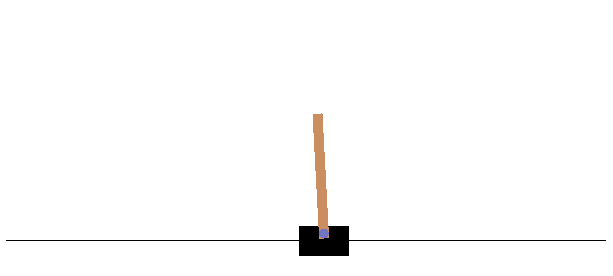
> oparte na: Barto, Sutton & Anderson *Neuronlike Adaptive Elements That Can Solve Difficult Learning Control Problem*, 1983

Słupek zamocowany jest do wózka, który porusza się bez tarcia po ścieżce. Przestrzeń stanów jest czteroelementowa:
* pozycja wózka,
* szybkość wózka,
* kąt nachylenia słupka,
* szybkość obrotu słupka.

Możemy kontrolować ruch wózka przykładając do niego siłę +1 lub -1. Celem jest zapobieganie przewróceniu słupka. Nagroda +1 przyznawana jest za każdy krok, kiedy słupek pozostaje pionowo. Epizod kończy się, gdy słupek odchylony jest o więcej niż 15 stopni od pionu, lub gry wózek odsunie się o ponad 2,4 jednostki od środka.


In [1]:
!apt-get install -y xvfb python-opengl > /dev/null 2>&1
!pip install gymnasium pyvirtualdisplay stable-baselines3[extra] > /dev/null 2>&1


In [2]:
import os
import random

import gymnasium as gym
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib import animation
from pyvirtualdisplay import Display
from stable_baselines3 import DQN
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.results_plotter import plot_results, load_results
from stable_baselines3.dqn.policies import MlpPolicy

from IPython import display as ipythondisplay

import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

SEED = 13
torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

DISPLAY = Display(visible=0, size=(400, 300))
DISPLAY.start()


Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


Metoda Deep Q-Learning wraz z wymienionymi wcześniej ulepszeniami jest już zaimplementowana w bibliotece Stable-Baselines3. Najpierw sprawdźmy hiperparametry, jakie możemy podać do modelu:


In [3]:
help(DQN)

Help on class DQN in module stable_baselines3.dqn.dqn:

class DQN(stable_baselines3.common.off_policy_algorithm.OffPolicyAlgorithm)
 |  DQN(policy: str | type[stable_baselines3.dqn.policies.DQNPolicy], env: Union[gymnasium.core.Env, ForwardRef('VecEnv'), str], learning_rate: float | collections.abc.Callable[[float], float] = 0.0001, buffer_size: int = 1000000, learning_starts: int = 100, batch_size: int = 32, tau: float = 1.0, gamma: float = 0.99, train_freq: int | tuple[int, str] = 4, gradient_steps: int = 1, replay_buffer_class: type[stable_baselines3.common.buffers.ReplayBuffer] | None = None, replay_buffer_kwargs: dict[str, typing.Any] | None = None, optimize_memory_usage: bool = False, n_steps: int = 1, target_update_interval: int = 10000, exploration_fraction: float = 0.1, exploration_initial_eps: float = 1.0, exploration_final_eps: float = 0.05, max_grad_norm: float = 10, stats_window_size: int = 100, tensorboard_log: str | None = None, policy_kwargs: dict[str, typing.Any] | Non

Kluczowym argumentem podawanym do modelu jest `policy`, czyli model strategii wykorzystywany w modelu. W Stable-Baselines3 każda metoda DRL posiada własny zestaw strategii - w przypadku DQN dostępne są trzy wersje (moduł `stable_baselines3.dqn.policies`:
- `MlpPolicy` - w pełni połączona
- `CnnPolicy` - z warstwami konwolucyjnymi
- `MultiInputPolicy` - dla środowisk, które umożliwiają obserwacje w formie obrazów jak i wartości.

W tym przykładzie będziemy wykorzystywać `MlpPolicy`, ponieważ środowisko nie zwraca obserwacji w formie obrazów. Sprawdźmy zatem, jakie argumenty ona przyjmuje (mogą one być przekazywane przez argument modelu `policy_kwargs`).


In [4]:
help(MlpPolicy)

Help on class DQNPolicy in module stable_baselines3.dqn.policies:

class DQNPolicy(stable_baselines3.common.policies.BasePolicy)
 |  DQNPolicy(observation_space: gymnasium.spaces.space.Space, action_space: gymnasium.spaces.discrete.Discrete, lr_schedule: collections.abc.Callable[[float], float], net_arch: list[int] | None = None, activation_fn: type[torch.nn.modules.module.Module] = <class 'torch.nn.modules.activation.ReLU'>, features_extractor_class: type[stable_baselines3.common.torch_layers.BaseFeaturesExtractor] = <class 'stable_baselines3.common.torch_layers.FlattenExtractor'>, features_extractor_kwargs: dict[str, typing.Any] | None = None, normalize_images: bool = True, optimizer_class: type[torch.optim.optimizer.Optimizer] = <class 'torch.optim.adam.Adam'>, optimizer_kwargs: dict[str, typing.Any] | None = None) -> None
 |
 |  Policy class with Q-Value Net and target net for DQN
 |
 |  :param observation_space: Observation space
 |  :param action_space: Action space
 |  :param lr

Szczególnie interesującym będzie dla nas argument `net_arch`, definiujący architekturę modelu strategii (jest to lista integerów, opisująca liczbę neuronów w poszczególnych warstwach ukrytych).


Deklarujemy funkcję do wyświetlania działania modelu. Poza tworzeniem animacji wykonuje ona również ewaluację modelu, sprawdzając w 100 epizodach osiąganą całkowitą wartość zwrotu.

Sprawdzimy od razu, jak zachowuje się niewytrenowany (losowy) model (zwróćmy uwagę, że musimy podać model strategii, jak i środowisko, w jakim model ma działać - możemy uzyskać do niego dostęp wywołując metodę modelu `get_env`).


In [5]:
def visualize_model(model, max_steps=50):
    """Show how a model works in the environment."""
    env = model.get_env()
    obs = env.reset()

    fig, ax = plt.subplots()
    frames = []
    done = False

    while not done:
        f = env.render(mode="rgb_array")
        if f is not None:
            frames.append(f.astype(np.uint8))
        with torch.no_grad():
            action, _ = model.predict(obs)
        obs, reward, done, info = env.step(action)
        if len(frames) >= max_steps:
            break

    anim = animation.FuncAnimation(
        fig=fig,
        func=lambda i: ax.imshow(frames[i]),
        frames=range(len(frames)),
        interval=100,
        blit=False,
    )
    plt.close()

    reward_avg, reward_std = evaluate_policy(model, env, n_eval_episodes=100)
    print(f"Reward in episode: {reward_avg:.2f} +/- {reward_std:.2f}")

    return anim.to_jshtml()


env = gym.make("CartPole-v1", render_mode="rgb_array")
model = DQN(MlpPolicy, env)
display(ipythondisplay.HTML(visualize_model(model)))


Reward in episode: 9.27 +/- 0.77


Zaczniemy od deklaracji uproszczonego modelu, ze stałą wartością $\epsilon$, bez target network oraz z experience replay o długości batcha (efektywnie - brakiem experience replay). Następnie będziemy chcieli włączać ulepszenia oraz stroić hiperparametry aby sprawdzić, jak wpływają one na działanie modelu. Do wytrenowania modelu służy metoda `learn`. Sprawdźmy jej parametry.


In [6]:
help(DQN.learn)

Help on function learn in module stable_baselines3.dqn.dqn:

learn(self: ~SelfDQN, total_timesteps: int, callback: Union[NoneType, collections.abc.Callable, list['BaseCallback'], ForwardRef('BaseCallback')] = None, log_interval: int = 4, tb_log_name: str = 'DQN', reset_num_timesteps: bool = True, progress_bar: bool = False) -> ~SelfDQN
    Return a trained model.

    :param total_timesteps: The total number of samples (env steps) to train on
        Note: it is a lower bound, see `issue #1150 <https://github.com/DLR-RM/stable-baselines3/issues/1150>`_
    :param callback: callback(s) called at every step with state of the algorithm.
    :param log_interval: for on-policy algos (e.g., PPO, A2C, ...) this is the number of
        training iterations (i.e., log_interval * n_steps * n_envs timesteps) before logging;
        for off-policy algos (e.g., TD3, SAC, ...) this is the number of episodes before
        logging.
    :param tb_log_name: the name of the run for TensorBoard logging
 

Z punktu widzenia analizy działania modelu potrzebna jest jedynie liczba kroków uczenia `total_timesteps`. Możemy też wyregulować częstość ewaluacji oraz logowania (wyświetlanie logu odbywa się jedynie przy ustawieniu `verbose=1`). Oprócz tego chcielibyśmy jednak także wyświetlić krzywą uczenia. Wykorzystujemy w tym celu wrapper na środowisko w Unity `Monitor`. Jako parametry przyjmuje on środowisko, które będziemy monitorować, oraz folder, w którym będziemy zapisywać logi. Możemy je potem wczytać i wyświetlić wykorzystując metody `load_results` i `plot_results`.


In [7]:
RESULTS_DIR = "/tmp/"

env = Monitor(env, filename=RESULTS_DIR)


Deklarujemy model. Ustawiając rozmiar bufora oraz start i częstość trenowania równe wielkości mini-batcha efektywnie wyłączamy experience replay, a aktualizując sieć w interwale równym wielkości batcha model trenowany będzie bez *target network*. Ponadto, dobieramy odpowiednio wartości schedulera $\epsilon$, tak, aby współczynnik ten był stały podczas trenowania.


In [8]:
batch_size = 64
lr = 1e-4
gamma = 0.8
eps = 0.1

env = gym.make("CartPole-v1")
log_dir = "/tmp/vanilla/"
os.makedirs(log_dir, exist_ok=True)  # we have to create this dir - it does not exist
env = Monitor(env, filename=log_dir)

vanilla_dqn = DQN(
    MlpPolicy, env,
    learning_rate=lr, batch_size=batch_size, gamma=gamma, seed=SEED,
    buffer_size=batch_size, learning_starts=batch_size, train_freq=batch_size,  # disable experience replay
    target_update_interval=batch_size,  # disable target network
    exploration_fraction=1, exploration_initial_eps=eps, exploration_final_eps=eps,  # disable epsilon scheduling
    verbose=1,  # show information throughout training
)


Using cpu device
Wrapping the env in a DummyVecEnv.


Wytrenujmy zatem taki prosty model w 100 000 kroków i sprawdźmy jakie osiągnie on po tym czasie rezultaty.


Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
|    n_updates        | 1332     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.96     |
|    ep_rew_mean      | 9.96     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 8648     |
|    fps              | 1632     |
|    time_elapsed     | 52       |
|    total_timesteps  | 85389    |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0797   |
|    n_updates        | 1333     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.91     |
|    ep_rew_mean      | 9.91     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 8652     |
|    fps              | 1632     |
|    time_elapsed     | 52       |
|    total_timesteps  | 8

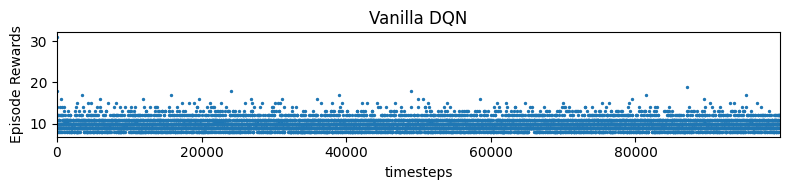

In [9]:
total_timesteps = 100000

vanilla_dqn.learn(total_timesteps)
display(ipythondisplay.HTML(visualize_model(vanilla_dqn)))
plot_results([log_dir], total_timesteps, "timesteps", "Vanilla DQN")


Jak widać, metoda Deep Q-Learning w domyślnym ustawieniu nie działa zbyt dobrze - model nie zbiega, oscylując wokół początkowych wartości nagrody. Być może strojenie hiperparametrów poprawiłoby osiągane rezultaty?

Sprawdźmy, jaka była maksymalna wartość zgromadzona w trakcie uczenia. Posłuży nam w tym celu funkcja `load_results`. Zwraca ona pandasowy DataFrame, w którym znajdują się informacje o każdym epizodzie w trakcie trenowania: uzyskanej nagrodzie `r`, długości epizodu `l` oraz jego czasie trwania `t`.


In [10]:
results = load_results(log_dir)
display(results.head(5))
print(f"Max reward: {results.r.max()}")


,index,r,l,t
0,0,14.0,14,0.033616
1,1,18.0,18,0.037137
2,2,12.0,12,0.040802
3,3,31.0,31,0.074224
4,4,11.0,11,0.083838


Max reward: 31.0


Spróbujemy powtórzyć wytrenowanie modelu, tym razem z wykorzystaniem *experience replay*.

Using cpu device
Wrapping the env in a DummyVecEnv.
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 18       |
|    exploration_rate | 0.993    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 6140     |
|    time_elapsed     | 0        |
|    total_timesteps  | 72       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 16.1     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 3241     |
|    time_elapsed     | 0        |
|    total_timesteps  | 129      |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.695    |
|    n_updates        | 7        |
----------------------------------
----------------------------------
| r

Max reward: 500.0


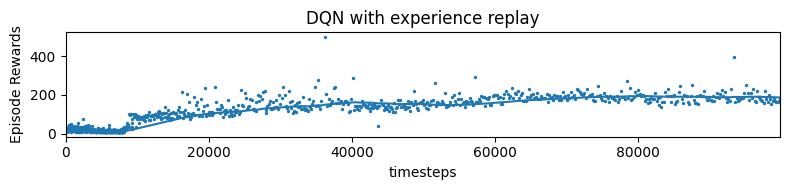

In [11]:
batch_size = 64
lr = 1e-4
gamma = 0.8

env = gym.make("CartPole-v1", render_mode="rgb_array")
log_dir = "/tmp/exp_replay/"
os.makedirs(log_dir, exist_ok=True)
env = Monitor(env, filename=log_dir)

dqn_exp = DQN(
    MlpPolicy, env,
    learning_rate=lr, batch_size=batch_size, gamma=gamma, seed=SEED,
    target_update_interval=batch_size,  # disable target network
    verbose=1,  # show information throughout training
)

total_timesteps = 100000

dqn_exp.learn(total_timesteps)
display(ipythondisplay.HTML(visualize_model(dqn_exp)))
plot_results([log_dir], total_timesteps, "timesteps", "DQN with experience replay")
results = load_results(log_dir)
print(f"Max reward: {results.r.max()}")


Jak widać rezultaty są dużo lepsze. Ale może udałoby się poprawić proces trenowania? Tego dotyczyć będą zadania.


## Zadanie 1

Zbadaj wpływ pozostałych ze wspomnianych hipeparametrów na trenowanie i działanie modelu. Skup się na zmianie architektury modelu strategii, hiperparametrach trenowania (gamma, epsilon itp.). Zapisz swoje wnioski oraz przygotuj wizualizacje uzyskiwanych rezultatów oraz animacje działania modelu.


In [12]:
import pandas as pd

TIMESTEPS = 100000  # liczba kroków uczenia w jednym eksperymencie

# Bazowa, sensowna konfiguracja dla CartPole z włączonymi wszystkimi ulepszeniami.
BASE_KWARGS = dict(
    learning_rate=1e-3,
    batch_size=64,
    gamma=0.99,
    buffer_size=50000,
    learning_starts=1000,
    target_update_interval=500,
    exploration_fraction=0.2,
    exploration_initial_eps=1.0,
    exploration_final_eps=0.05,
)


def run_experiment(name, total_timesteps=TIMESTEPS, seed=SEED, **overrides):
    """Trenuje DQN z BASE_KWARGS nadpisanym przez `overrides`.

    Zwraca (model, log_dir, reward_avg, reward_std).
    `net_arch` przekazujemy jako policy_kwargs=dict(net_arch=...).
    """
    kwargs = {**BASE_KWARGS, **overrides}
    policy_kwargs = kwargs.pop("policy_kwargs", None)

    log_dir = f"/tmp/zad1/{name}/"
    os.makedirs(log_dir, exist_ok=True)
    env = gym.make("CartPole-v1", render_mode="rgb_array")

    env = Monitor(env, filename=log_dir)

    model = DQN(
        MlpPolicy, env, seed=seed, verbose=0,
        policy_kwargs=policy_kwargs, **kwargs,
    )
    model.learn(total_timesteps)

    # Ewaluacja na osobnym środowisku, aby nie zanieczyszczać logów treningowych.
    eval_env = Monitor(gym.make("CartPole-v1"))
    reward_avg, reward_std = evaluate_policy(model, eval_env, n_eval_episodes=100)
    max_reward = load_results(log_dir).r.max()
    print(f"[{name:>18}] ewaluacja: {reward_avg:6.1f} +/- {reward_std:5.1f}"
          f" | maks. nagroda w treningu: {max_reward:.0f}")
    return model, log_dir, reward_avg, reward_std


def moving_average(values, window):
    weights = np.ones(window) / window
    return np.convolve(values, weights, mode="valid")


def compare_learning_curves(log_dirs, labels, window=50, title="Porównanie krzywych uczenia"):
    """Rysuje wygładzone krzywe uczenia (nagroda vs. krok) dla kilku eksperymentów."""
    plt.figure(figsize=(10, 6))
    for log_dir, label in zip(log_dirs, labels):
        results = load_results(log_dir)
        rewards = results.r.values
        timesteps = np.cumsum(results.l.values)
        if len(rewards) >= window:
            y = moving_average(rewards, window)
            x = timesteps[len(timesteps) - len(y):]
        else:
            x, y = timesteps, rewards
        plt.plot(x, y, label=label)
    plt.xlabel("Krok uczenia")
    plt.ylabel(f"Nagroda (średnia krocząca, okno={window})")
    plt.title(title)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()


def summarize_and_animate(records, param_name, title):
    """records: lista słowników z kluczami: label, model, log_dir, reward_avg, reward_std.

    Buduje tabelkę wyników, rysuje krzywe uczenia oraz odpala animację
    najlepszego (wg średniej nagrody ewaluacji) modelu z danego eksperymentu.
    """
    # Tabelka wyników
    df = pd.DataFrame([
        {param_name: r["label"],
         "ewaluacja (śr.)": r["reward_avg"],
         "ewaluacja (odch. std)": r["reward_std"]}
        for r in records
    ]).sort_values("ewaluacja (śr.)", ascending=False).reset_index(drop=True)
    print(f"=== {title} ===")
    display(df.style.hide(axis="index").format(
        {"ewaluacja (śr.)": "{:.1f}", "ewaluacja (odch. std)": "{:.1f}"}))

    # Krzywe uczenia
    compare_learning_curves([r["log_dir"] for r in records],
                            [r["label"] for r in records], title=title)

    # Animacja najlepszego modelu
    best = max(records, key=lambda r: r["reward_avg"])
    print(f"Najlepszy wariant: {param_name}={best['label']} "
          f"(ewaluacja {best['reward_avg']:.1f} +/- {best['reward_std']:.1f}) — animacja:")
    display(ipythondisplay.HTML(visualize_model(best["model"])))


### Eksperyment A - architektura sieci strategii (`net_arch`)

Sprawdzamy, jak pojemność sieci (liczba i szerokość warstw ukrytych) wpływa na uczenie.

[           arch_32] ewaluacja:   53.1 +/-  11.3 | maks. nagroda w treningu: 293
[          arch_128] ewaluacja:  357.9 +/-  10.9 | maks. nagroda w treningu: 500
[        arch_64_64] ewaluacja:  200.1 +/-   4.8 | maks. nagroda w treningu: 500
[      arch_256_256] ewaluacja:  488.8 +/-  21.2 | maks. nagroda w treningu: 500
[     arch_64_64_64] ewaluacja:  103.9 +/-   2.2 | maks. nagroda w treningu: 282
[  arch_256_256_256] ewaluacja:  500.0 +/-   0.0 | maks. nagroda w treningu: 500
=== Wpływ architektury sieci strategii ===


net_arch,ewaluacja (śr.),ewaluacja (odch. std)
"[256, 256, 256]",500.0,0.0
"[256, 256]",488.8,21.2
[128],357.9,10.9
"[64, 64]",200.1,4.8
"[64, 64, 64]",103.9,2.2
[32],53.1,11.3


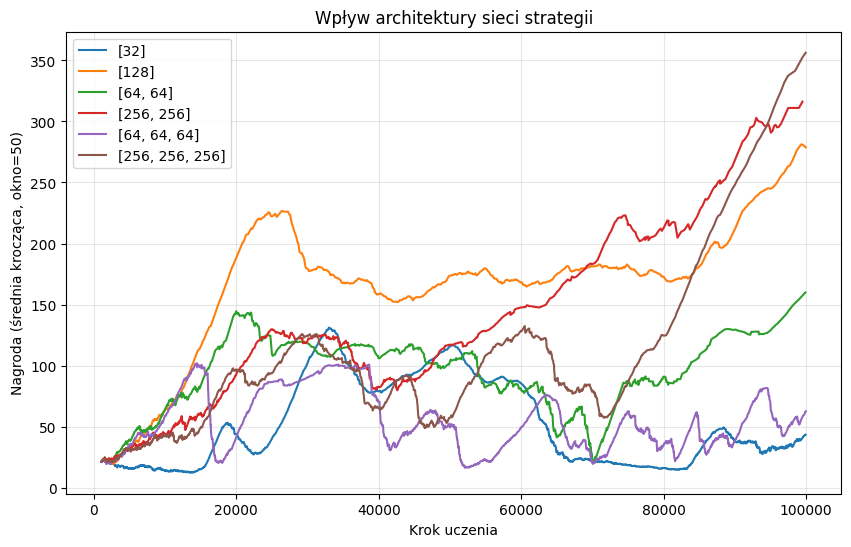

Najlepszy wariant: net_arch=[256, 256, 256] (ewaluacja 500.0 +/- 0.0) — animacja:
Reward in episode: 500.00 +/- 0.00


In [13]:
import warnings

warnings.filterwarnings("ignore", category=UserWarning, module="stable_baselines3")

arch_configs = [
    ("arch_32",          "[32]",            [32]),
    ("arch_128",         "[128]",           [128]),
    ("arch_64_64",       "[64, 64]",        [64, 64]),
    ("arch_256_256",     "[256, 256]",      [256, 256]),
    ("arch_64_64_64",    "[64, 64, 64]",    [64, 64, 64]),
    ("arch_256_256_256", "[256, 256, 256]", [256, 256, 256]),
]

arch_records = []
for name, label, net in arch_configs:
    model, d, avg, std = run_experiment(name, policy_kwargs=dict(net_arch=net))
    arch_records.append(dict(label=label, model=model, log_dir=d, reward_avg=avg, reward_std=std))

summarize_and_animate(arch_records, "net_arch", "Wpływ architektury sieci strategii")


### Eksperyment B - współczynnik dyskontowania `gamma`

`gamma` określa, jak silnie agent uwzględnia przyszłe nagrody. W CartPole, gdzie celem jest
utrzymanie się jak najdłużej, daleki horyzont (wysoka `gamma`) jest kluczowy.

[          gamma_05] ewaluacja:  114.3 +/-  21.1 | maks. nagroda w treningu: 393
[          gamma_07] ewaluacja:  114.3 +/-   3.2 | maks. nagroda w treningu: 500
[          gamma_08] ewaluacja:   97.5 +/-   2.7 | maks. nagroda w treningu: 497
[          gamma_09] ewaluacja:   98.9 +/-   2.8 | maks. nagroda w treningu: 458
[         gamma_095] ewaluacja:  103.0 +/-   2.9 | maks. nagroda w treningu: 428
[         gamma_099] ewaluacja:  200.0 +/-   4.7 | maks. nagroda w treningu: 500
[        gamma_0999] ewaluacja:  397.4 +/- 199.1 | maks. nagroda w treningu: 500
=== Wpływ współczynnika dyskontowania gamma ===


gamma,ewaluacja (śr.),ewaluacja (odch. std)
0.999,397.4,199.1
0.99,200.0,4.7
0.7,114.3,3.2
0.5,114.3,21.1
0.95,103.0,2.9
0.9,98.9,2.8
0.8,97.5,2.7


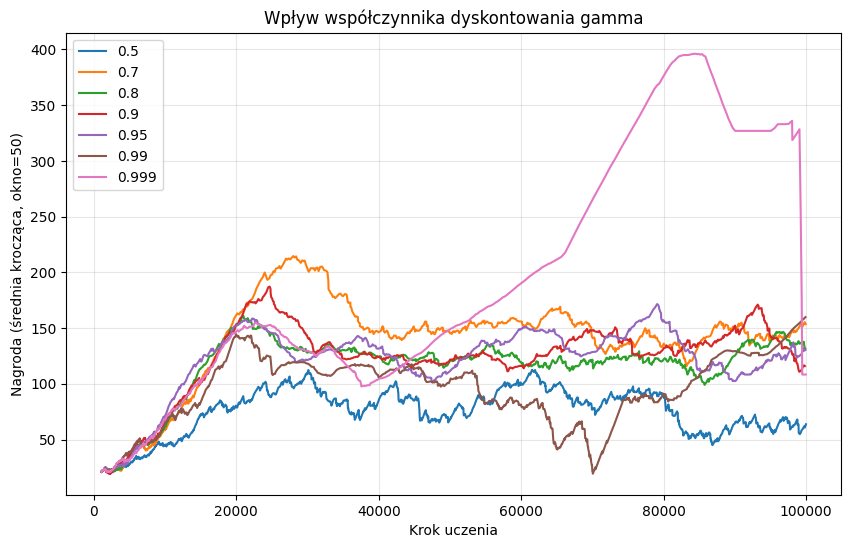

Najlepszy wariant: gamma=0.999 (ewaluacja 397.4 +/- 199.1) — animacja:
Reward in episode: 382.75 +/- 208.65


In [14]:
gamma_records = []
for g in [0.5, 0.7, 0.8, 0.9, 0.95, 0.99, 0.999]:
    name = f"gamma_{str(g).replace('.', '')}"
    model, d, avg, std = run_experiment(name, gamma=g)
    gamma_records.append(dict(label=f"{g}", model=model, log_dir=d, reward_avg=avg, reward_std=std))

summarize_and_animate(gamma_records, "gamma", "Wpływ współczynnika dyskontowania gamma")


### Eksperyment C - harmonogram eksploracji $\epsilon$

Porównujemy stałą wartość $\epsilon$ z harmonogramami malejącymi (różna szybkość spadku).
`exploration_fraction` to ułamek treningu, w którym $\epsilon$ maleje od wartości początkowej do końcowej.

[         eps_const] ewaluacja:  241.7 +/- 160.8 | maks. nagroda w treningu: 500
[          eps_fast] ewaluacja:  418.6 +/- 112.2 | maks. nagroda w treningu: 500
[           eps_med] ewaluacja:  500.0 +/-   0.0 | maks. nagroda w treningu: 500
[          eps_slow] ewaluacja:   79.9 +/-  26.9 | maks. nagroda w treningu: 359
[          eps_high] ewaluacja:   95.2 +/-   2.8 | maks. nagroda w treningu: 489
=== Wpływ harmonogramu eksploracji epsilon ===


epsilon,ewaluacja (śr.),ewaluacja (odch. std)
średni spadek (frac=0.3),500.0,0.0
szybki spadek (frac=0.1),418.6,112.2
stałe eps=0.1,241.7,160.8
wysoki końcowy eps=0.2 (frac=0.3),95.2,2.8
wolny spadek (frac=0.5),79.9,26.9


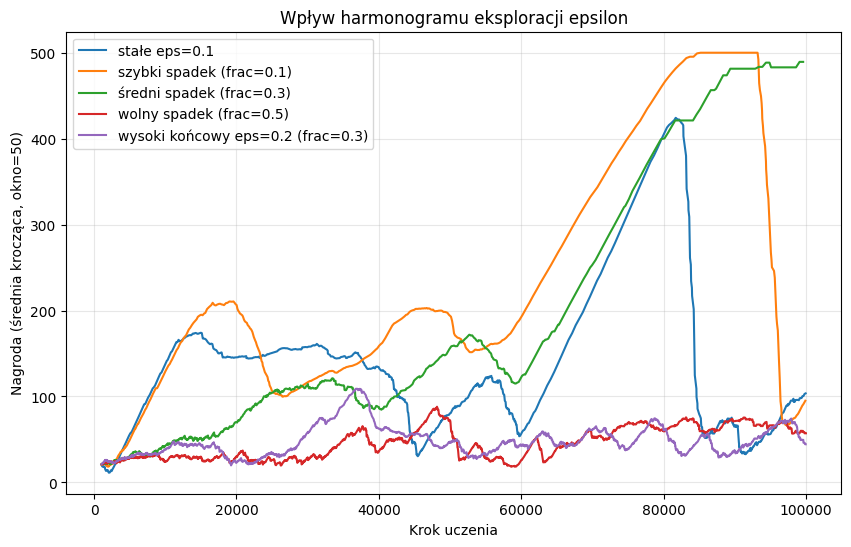

Najlepszy wariant: epsilon=średni spadek (frac=0.3) (ewaluacja 500.0 +/- 0.0) — animacja:
Reward in episode: 500.00 +/- 0.00


In [15]:
eps_configs = [
    ("eps_const",  "stałe eps=0.1",
     dict(exploration_initial_eps=0.1, exploration_final_eps=0.1, exploration_fraction=1.0)),
    ("eps_fast",   "szybki spadek (frac=0.1)",
     dict(exploration_initial_eps=1.0, exploration_final_eps=0.02, exploration_fraction=0.1)),
    ("eps_med",    "średni spadek (frac=0.3)",
     dict(exploration_initial_eps=1.0, exploration_final_eps=0.02, exploration_fraction=0.3)),
    ("eps_slow",   "wolny spadek (frac=0.5)",
     dict(exploration_initial_eps=1.0, exploration_final_eps=0.02, exploration_fraction=0.5)),
    ("eps_high",   "wysoki końcowy eps=0.2 (frac=0.3)",
     dict(exploration_initial_eps=1.0, exploration_final_eps=0.2, exploration_fraction=0.3)),
]

eps_records = []
for name, label, cfg in eps_configs:
    model, d, avg, std = run_experiment(name, **cfg)
    eps_records.append(dict(label=label, model=model, log_dir=d, reward_avg=avg, reward_std=std))

summarize_and_animate(eps_records, "epsilon", "Wpływ harmonogramu eksploracji epsilon")


### Eksperyment D - współczynnik uczenia `learning_rate`

Zbyt mały `learning_rate` spowalnia uczenie, zbyt duży może je zdestabilizować.

[          lr_1e-04] ewaluacja:    9.3 +/-   0.8 | maks. nagroda w treningu: 60
[          lr_5e-04] ewaluacja:  122.4 +/-  85.5 | maks. nagroda w treningu: 500
[          lr_1e-03] ewaluacja:  200.7 +/-   4.9 | maks. nagroda w treningu: 500
[          lr_5e-03] ewaluacja:   37.1 +/-  11.0 | maks. nagroda w treningu: 500
[          lr_1e-02] ewaluacja:   79.4 +/-  26.2 | maks. nagroda w treningu: 355
=== Wpływ współczynnika uczenia learning_rate ===


learning_rate,ewaluacja (śr.),ewaluacja (odch. std)
1e-03,200.7,4.9
5e-04,122.4,85.5
1e-02,79.4,26.2
5e-03,37.1,11.0
1e-04,9.3,0.8


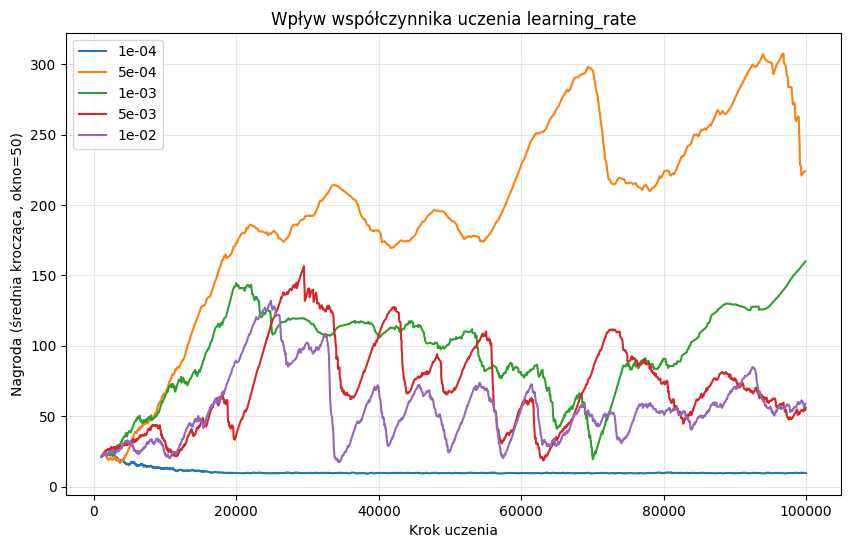

Najlepszy wariant: learning_rate=1e-03 (ewaluacja 200.7 +/- 4.9) — animacja:
Reward in episode: 201.03 +/- 5.01


In [16]:
lr_records = []
for lr in [1e-4, 5e-4, 1e-3, 5e-3, 1e-2]:
    name = f"lr_{lr:.0e}"
    model, d, avg, std = run_experiment(name, learning_rate=lr)
    lr_records.append(dict(label=f"{lr:.0e}", model=model, log_dir=d, reward_avg=avg, reward_std=std))

summarize_and_animate(lr_records, "learning_rate", "Wpływ współczynnika uczenia learning_rate")


### Eksperyment E - częstotliwość aktualizacji target network (`target_update_interval`)

Sieć docelowa (*target network*) to jedno z kluczowych ulepszeń DQN stabilizujących uczenie. Im rzadziej ją aktualizujemy (większy `target_update_interval`), tym stabilniejsze, ale wolniejsze cele uczenia. Wartość `1` odpowiada w praktyce brakowi osobnej sieci docelowej.

[             tui_1] ewaluacja:    9.3 +/-   0.7 | maks. nagroda w treningu: 65
[           tui_100] ewaluacja:    9.3 +/-   0.7 | maks. nagroda w treningu: 68
[           tui_500] ewaluacja:  200.0 +/-   4.7 | maks. nagroda w treningu: 500
[          tui_2000] ewaluacja:   66.9 +/-  26.7 | maks. nagroda w treningu: 500
[          tui_5000] ewaluacja:  121.7 +/-   5.6 | maks. nagroda w treningu: 500
=== Wpływ częstotliwości aktualizacji target network ===


target_update_interval,ewaluacja (śr.),ewaluacja (odch. std)
500,200.0,4.7
5000,121.7,5.6
2000,66.9,26.7
100,9.3,0.7
1,9.3,0.7


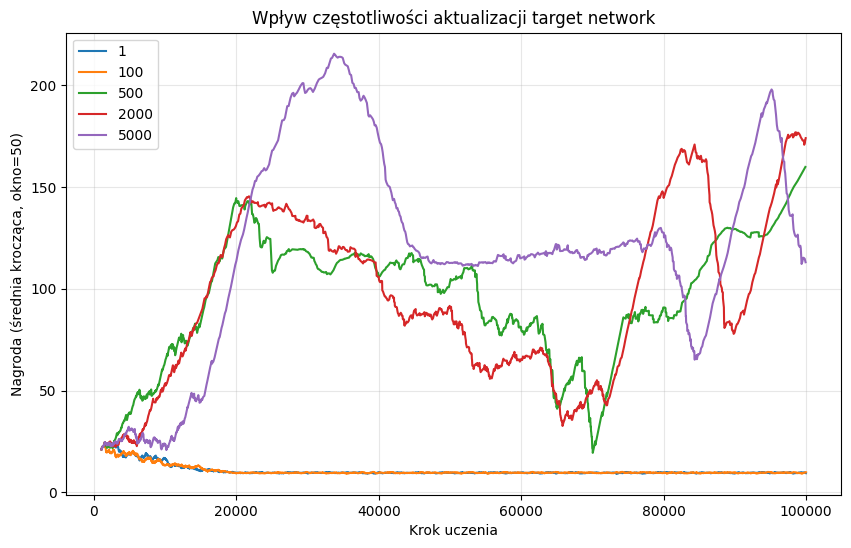

Najlepszy wariant: target_update_interval=500 (ewaluacja 200.0 +/- 4.7) — animacja:
Reward in episode: 201.03 +/- 5.01


In [17]:
tui_records = []
for tui in [1, 100, 500, 2000, 5000]:
    name = f"tui_{tui}"
    model, d, avg, std = run_experiment(name, target_update_interval=tui)
    tui_records.append(dict(label=f"{tui}", model=model, log_dir=d, reward_avg=avg, reward_std=std))

summarize_and_animate(tui_records, "target_update_interval",
                      "Wpływ częstotliwości aktualizacji target network")


### Eksperyment F - rozmiar bufora powtórek (`buffer_size`)

*Experience replay* przechowuje przeszłe przejścia i losuje z nich minibatche, co dekoreluje próbki i poprawia efektywność próbkowania. Mały bufor (np. `1000`) oznacza, że model uczy się głównie na świeżych, silnie skorelowanych przejściach - efektywnie osłabia to ulepszenie.

[       buffer_1000] ewaluacja:  170.1 +/-   7.4 | maks. nagroda w treningu: 500
[      buffer_10000] ewaluacja:  500.0 +/-   0.0 | maks. nagroda w treningu: 500
[      buffer_50000] ewaluacja:  200.8 +/-   4.9 | maks. nagroda w treningu: 500
[     buffer_100000] ewaluacja:  222.6 +/-   4.0 | maks. nagroda w treningu: 500
=== Wpływ rozmiaru bufora powtórek (experience replay) ===


buffer_size,ewaluacja (śr.),ewaluacja (odch. std)
10000,500.0,0.0
100000,222.6,4.0
50000,200.8,4.9
1000,170.1,7.4


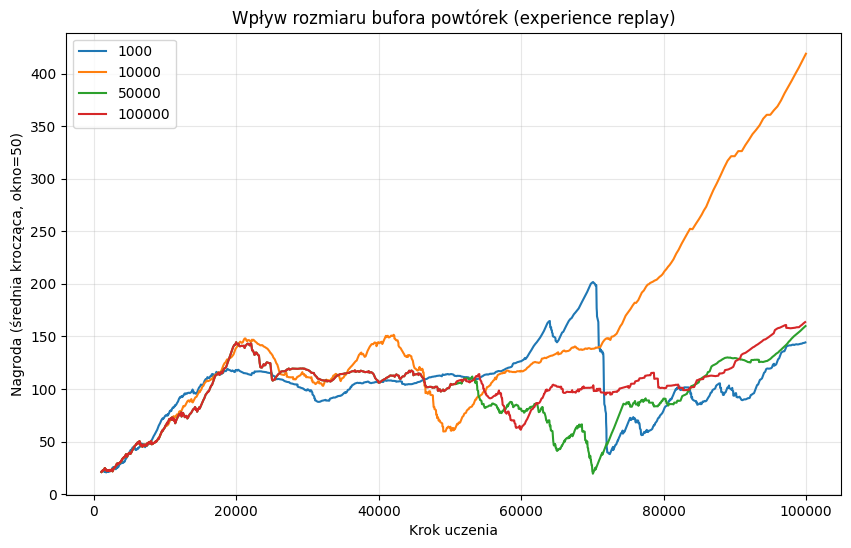

Najlepszy wariant: buffer_size=10000 (ewaluacja 500.0 +/- 0.0) — animacja:
Reward in episode: 500.00 +/- 0.00


In [18]:
buf_records = []
for buf in [1000, 10000, 50000, 100000]:
    name = f"buffer_{buf}"
    model, d, avg, std = run_experiment(name, buffer_size=buf)
    buf_records.append(dict(label=f"{buf}", model=model, log_dir=d, reward_avg=avg, reward_std=std))

summarize_and_animate(buf_records, "buffer_size",
                      "Wpływ rozmiaru bufora powtórek (experience replay)")


## Zadanie 2

Wykorzystaj metodę Deep Q-Learning do przygotowania agenta działającego w wybranym innym środowisku z biblioteki [Gymnasium](https://gymnasium.farama.org/index.html). Ze względu na cechy modelu zwróć uwagę na dopasowanie środowiska (np. przestrzeń akcji powinna być dyskretna). Zapoznaj się z definicją funkcji nagrody przyznawanej agentowi w środowisku, aby można było zinterpretować rezultaty osiągane przez model. Jeśli zdecydujesz się na wykorzystanie środowiska z obserwacjami wizualnymi, pamiętaj o zmianie typu modelu strategii (uwaga: trenowanie modeli w oparciu o obserwacje wizualne z wykorzystaniem sieci konwolucyjnym jest długotrwałe i może być bardziej niestabilne niż w przypadku strategii MLP). Spróbuj dostroić hiperparametry trenowania do nowego środowiska.


### Wybór środowiska: `LunarLander-v3`

Wybieramy środowisko **LunarLander-v3** (lądownik księżycowy). Spełnia wymagania zadania:

* **Dyskretna przestrzeń akcji** (4 akcje), zgodna z DQN: `0` - nic nie rób, `1` - odpal lewy silnik, `2` - odpal główny silnik, `3` - odpal prawy silnik.
* **Wektorowa przestrzeń obserwacji** (8 liczb): położenie `(x, y)`, prędkości `(vx, vy)`, kąt i prędkość kątowa lądownika oraz dwie flagi kontaktu nóg z podłożem. Dzięki temu wystarcza strategia **MLP** - nie potrzebujemy sieci konwolucyjnej.

**Funkcja nagrody** (kluczowa do interpretacji wyników):

* zbliżanie się / oddalanie od lądowiska i wytracanie prędkości daje (odpowiednio) nagrodę dodatnią / ujemną,
* przechylenie lądownika jest karane,
* każda noga dotykająca podłoża to **+10**,
* odpalanie głównego silnika kosztuje **-0.3**, a bocznego **-0.03** za krok (zachęta do oszczędnego sterowania),
* **rozbicie** to **-100**, a **bezpieczne lądowanie** to **+100**.

Epizod uznaje się za **rozwiązany** przy średniej nagrodzie **>= 200** punktów. To nasz cel jakościowy.

Środowisko LunarLander wymaga silnika fizyki Box2D. Jeśli nie jest zainstalowany (np. na świeżym Colabie), odkomentuj poniższą instalację.

In [19]:
!pip install "gymnasium[box2d]" swig -q


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 62.9 MB/s eta 0:00:00


Output()

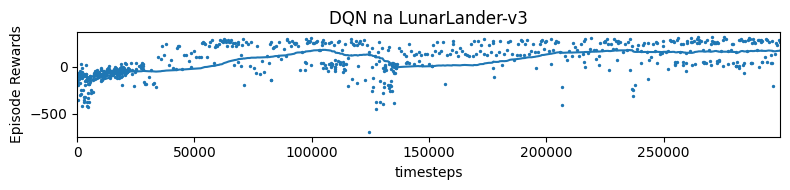

In [20]:
LL_TIMESTEPS = 300000
ll_log_dir = "/tmp/zad2/lunarlander/"
os.makedirs(ll_log_dir, exist_ok=True)

ll_env = gym.make("LunarLander-v3", render_mode="rgb_array")
ll_env = Monitor(ll_env, filename=ll_log_dir)

ll_model = DQN(
    MlpPolicy, ll_env, seed=SEED, verbose=0,
    policy_kwargs=dict(net_arch=[256, 256]),
    learning_rate=6.3e-4,
    batch_size=128,
    gamma=0.99,
    buffer_size=50000,
    learning_starts=5000,
    train_freq=4,
    gradient_steps=-1,
    target_update_interval=250,
    exploration_fraction=0.12,
    exploration_initial_eps=1.0,
    exploration_final_eps=0.1,
)

ll_model.learn(LL_TIMESTEPS, progress_bar=True)

plot_results([ll_log_dir], LL_TIMESTEPS, "timesteps", "DQN na LunarLander-v3")


Ewaluujemy wytrenowany model na 20 epizodach (na osobnym środowisku) i oglądamy animację jego działania.

In [21]:
ll_eval_env = Monitor(gym.make("LunarLander-v3"))
ll_avg, ll_std = evaluate_policy(ll_model, ll_eval_env, n_eval_episodes=20)
print(f"LunarLander-v3 | ewaluacja: {ll_avg:.1f} +/- {ll_std:.1f}"
      f" ({'ROZWIAZANE' if ll_avg >= 200 else 'jeszcze nie rozwiazane'}, prog = 200)")

display(ipythondisplay.HTML(visualize_model(ll_model, max_steps=400)))


LunarLander-v3 | ewaluacja: 185.3 +/- 171.5 (jeszcze nie rozwiazane, prog = 200)
Reward in episode: 218.73 +/- 127.68


### Wnioski

* DQN poradził sobie z trudniejszym, ciągłym sterowaniem przy **dyskretnej** przestrzeni 4 akcji, mimo dłuższych epizodów i opóźnionej nagrody za lądowanie.
* Najważniejsze różnice względem CartPole to **dłuższy trening** oraz **wolniejsze wygaszanie eksploracji** - bez tego agent zbyt wcześnie przechodzi na zachłanną politykę i utyka na strategii "lewituj / nie rozbij się", nie ucząc się lądować.
* Krzywa uczenia bywa **niestabilna** (DQN potrafi chwilowo się pogorszyć) - to typowe dla tego środowiska; pomaga większy bufor powtórek i częstsze kroki gradientu.